## Выпускная квалификационная работа Яневица Рональда Бруновича
## студента группы 15702 курса "Data Science PRO" ЦДО МГТУ им. Н.Э. Баумана
#### Тема исследования "Прогнозирование конечных свойств новых материалов (композиционных материалов)".
#### Цель исследования:
#### 1. Построение модели машинного обучения для прогнозирования параметров: "модуль упругости при растяжении" и "прочность при растяжении";
#### 2. Написание нейросети для рекомендации "соотношение матрица-наполнитель".
#### Результат работы: приложение с графическим интерфейсом, которое будет выдавать прогноз параметров 1 и 2.

## 1. Загрузка исходных данных. Предварительная обработка.

In [ ]:
# Задание предписывает выполнить:
# Обучить алгоритм машинного обучения, который будет определять значения:
# 1. Модуль упругости при растяжении, ГПа;
# 2. Прочность при растяжении, МПа.
# При построении модели необходимо 30% данных оставить на тестирование модели, на остальных происходит обучение моделей. 
# При построении моделей провести поиск гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10.
# 
# Написать нейронную сеть, которая будет рекомендовать:
# 3. Соотношение матрица-наполнитель.
#
# Исходные данные - 2 таблицы в формате Excel:
# Таблица X_bp.xlsx содержит данные о начальных свойствах компонентов композиционных материалов;
# Таблица X_nup.xlsx, вероятнее всего, содержит данные о технологии создания композиционного материала.

In [1]:
# Импорт библиотек, необходимых для чтения данных и их разведочного анализа (EDA).
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Чтение исходных данных о начальных свойствах компонентов композиционных материалов.
# Первый столбец файла представляет собой последовательную нумерацию строк, поэтому сразу прочитаем его как индекс.
X_bp = pd.read_excel('X_bp.xlsx', index_col='Unnamed: 0')
X_bp

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [3]:
# Проверим количество и тип данных по столбцам
X_bp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [4]:
# Проверим количество пропущенных значений
X_bp.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
dtype: int64

In [ ]:
# Файл свойств компонентов композиционных материалов состоит из 10 столбцов и 1023 строк. 
# Все данные числовые, пропусков данных нет.

In [ ]:
# Чтение исходных данных о технологии создания композиционного материала.
# Первый столбец файла представляет собой последовательную нумерацию строк, поэтому сразу прочитаем его как индекс.
X_nup = pd.read_excel('X_nup.xlsx', index_col='Unnamed: 0')
X_nup

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.000000,57.000000
1,0,4.000000,60.000000
2,0,4.000000,70.000000
3,0,5.000000,47.000000
4,0,5.000000,57.000000
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [6]:
# Проверим количество и тип данных по столбцам
X_nup.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [7]:
# Проверим количество пропущенных значений
X_nup.isnull().sum()

Угол нашивки, град    0
Шаг нашивки           0
Плотность нашивки     0
dtype: int64

In [4]:
# Файл технологии создания композиционных материалов состоит из 3 столбцов и 1040 строк. 
# Все данные числовые, пропусков данных нет.
# По условиям задания необходимо объединить эти два файла, объединение делать по индексу, тип объединения — INNER:
df = pd.merge(X_bp, X_nup, left_index = True, right_index = True, how='inner')
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [9]:
# Посмотрим общую информацию по дата фрейму
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

In [10]:
# Проверим количество пропущенных значений
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [11]:
# Проверим наличие дублирующихся строк
df.duplicated().sum()

np.int64(0)

In [12]:
# Посмотрим описательную статистику объединённого дата фрейма.
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [ ]:
# Посмотрим на мин/медиан/мах значения параметров
min_max_df = pd.DataFrame({
    'min': df.min(),
    'median': df.median(),
    'max': df.max()
})
min_max_df

,min,median,max
Соотношение матрица-наполнитель,0.389403,2.906878,5.591742
"Плотность, кг/м3",1731.764635,1977.621657,2207.773481
"модуль упругости, ГПа",2.436909,739.664328,1911.536477
"Количество отвердителя, м.%",17.740275,110.564840,198.953207
"Содержание эпоксидных групп,%_2",14.254985,22.230744,33.000000
"Температура вспышки, С_2",100.000000,285.896812,413.273418
"Поверхностная плотность, г/м2",0.603740,451.864365,1399.542362
"Модуль упругости при растяжении, ГПа",64.054061,73.268805,82.682051
"Прочность при растяжении, МПа",1036.856605,2459.524526,3848.436732
"Потребление смолы, г/м2",33.803026,219.198882,414.590628


In [ ]:
# Большинство параметров выглядит адекватно, но есть исключения.
# Сразу бросается в глаза соотношение мин/макс значений следующих параметров:
# модуль упругости, ГПа менятся от 2.436909 до 1911.536477 с медианой 739.664328, 
# очень большой диапазон, очень большие значения.
# Поверхностная плотность, г/м2 менятся от 0.603740	до 1399.542362 с медианой 451.864365.
# Тоже очень большой диапазон и очень большие значения.
# И  у параметров Шаг нашивки и Плотность нашивки мин значение 0, чего, по-моему, быть не может,
# вероятнее всего ошибка.

In [13]:
# Проверим количество уникальных значений в каждом столбце.
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [ ]:
# Все данные в объединённом дата фрейме, включая целевые переменные, являются вещественными (float64), 
# дублирующихся данных нет, пропусков в данных нет.
# Единственный отличающийся параметр "угол нашивки", который имеет целочисленный тип (int64) и 
# всего 2 значения - 0 и 90 градусов, его можно сделать бинарным.
# Непонятно, как "шаг нашивки" и "плотность нашивки" могут быть равны 0, скорее всего - 
# какая-то ошибка, - проверим, сколько строк содержат такие данные:

In [14]:
df[df['Шаг нашивки'] == 0]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
19,3.532338,1980.0,1183.0,111.86,22.267857,284.615385,1010.0,78.0,2000.0,300.0,0,0.0,0.0


In [15]:
df[df['Плотность нашивки'] == 0]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
19,3.532338,1980.0,1183.0,111.86,22.267857,284.615385,1010.0,78.0,2000.0,300.0,0,0.0,0.0


In [ ]:
# И "шаг нашивки" и "плотность нашивки" равны 0 только в одной строке, т.к. скорее всего это ошибка, 
# то удаляю эту строку из объединённого дата фрейма и восстанавливаю последовательность индексов.
df = df.drop(df[df['Шаг нашивки'] == 0].index)
df = df.reset_index()
df = df.drop(columns = ['index'], axis = 1)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1022.0,2.929777,0.913475,0.389403,2.317247,2.906630,3.552781,5.591742
"Плотность, кг/м3",1022.0,1975.730715,73.765207,1731.764635,1924.134147,1977.603973,2021.384103,2207.773481
"модуль упругости, ГПа",1022.0,739.489694,330.101862,2.436909,499.321940,739.310747,960.465724,1911.536477
"Количество отвердителя, м.%",1022.0,110.569507,28.309736,17.740275,92.431413,110.549159,129.732521,198.953207
"Содержание эпоксидных групп,%_2",1022.0,22.244367,2.407479,14.254985,20.607747,22.230545,23.962050,33.000000
"Температура вспышки, С_2",1022.0,285.883391,40.963286,100.000000,259.029216,285.922290,313.012786,413.273418
"Поверхностная плотность, г/м2",1022.0,482.215915,280.967801,0.603740,266.654559,451.588705,692.342336,1399.542362
"Модуль упругости при растяжении, ГПа",1022.0,73.324000,3.117080,64.054061,71.241213,73.266770,75.338920,82.682051
"Прочность при растяжении, МПа",1022.0,2467.379714,485.645758,1036.856605,2136.259145,2460.260972,2768.016102,3848.436732
"Потребление смолы, г/м2",1022.0,218.343323,59.710570,33.803026,179.604490,219.189018,257.399329,414.590628


In [ ]:
# Приведём столбец "Угол нашивки" к категориальному типу.
# Заодно для дальнейшего удобства переименуем все столбцы, чтобы убрать спец символы.
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype('category')
df = df.rename(columns={
    'Соотношение матрица-наполнитель' : 'Соотношение матрица_наполнитель',
    'Плотность, кг/м3' : 'Плотность',
    'модуль упругости, ГПа' : 'Модуль упругости',
    'Количество отвердителя, м.%' : 'Количество отвердителя',
    'Содержание эпоксидных групп,%_2' : 'Содержание эпоксидных групп',
    'Температура вспышки, С_2' : 'Температура вспышки',
    'Поверхностная плотность, г/м2' : 'Поверхностная плотность',
    'Потребление смолы, г/м2' : 'Потребление смолы',
    'Угол нашивки, град' : 'Угол нашивки',
    'Прочность при растяжении, МПа' : 'Прочность при растяжении',
    'Модуль упругости при растяжении, ГПа' : 'Модуль упругости при растяжении'})

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1022 entries, 0 to 1021
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Соотношение матрица_наполнитель  1022 non-null   float64 
 1   Плотность                        1022 non-null   float64 
 2   Модуль упругости                 1022 non-null   float64 
 3   Количество отвердителя           1022 non-null   float64 
 4   Содержание эпоксидных групп      1022 non-null   float64 
 5   Температура вспышки              1022 non-null   float64 
 6   Поверхностная плотность          1022 non-null   float64 
 7   Модуль упругости при растяжении  1022 non-null   float64 
 8   Прочность при растяжении         1022 non-null   float64 
 9   Потребление смолы                1022 non-null   float64 
 10  Угол нашивки                     1022 non-null   category
 11  Шаг нашивки                      1022 non-null   float64 
 12  Плотно

In [ ]:
# Итоговый дата фрейм содержит 1022 строки. Для удобства дальнейшей работы выполню его сортировку по столбцам
#  - перенесу целевые признаки в правую часть.
df = df[[
    'Плотность',
    'Модуль упругости',
    'Количество отвердителя',
    'Содержание эпоксидных групп',
    'Температура вспышки',
    'Поверхностная плотность',
    'Потребление смолы',
    'Угол нашивки',
    'Шаг нашивки',
    'Плотность нашивки',
    'Соотношение матрица_наполнитель',
    'Прочность при растяжении',
    'Модуль упругости при растяжении']]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1022 entries, 0 to 1021
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Плотность                        1022 non-null   float64 
 1   Модуль упругости                 1022 non-null   float64 
 2   Количество отвердителя           1022 non-null   float64 
 3   Содержание эпоксидных групп      1022 non-null   float64 
 4   Температура вспышки              1022 non-null   float64 
 5   Поверхностная плотность          1022 non-null   float64 
 6   Потребление смолы                1022 non-null   float64 
 7   Угол нашивки                     1022 non-null   category
 8   Шаг нашивки                      1022 non-null   float64 
 9   Плотность нашивки                1022 non-null   float64 
 10  Соотношение матрица_наполнитель  1022 non-null   float64 
 11  Прочность при растяжении         1022 non-null   float64 
 12  Модуль

In [ ]:
# Ещё раз ппосмотрим описательную статистику
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Плотность,1022.0,NaN,NaN,NaN,1975.730715,73.765207,1731.764635,1924.134147,1977.603973,2021.384103,2207.773481
Модуль упругости,1022.0,NaN,NaN,NaN,739.489694,330.101862,2.436909,499.321940,739.310747,960.465724,1911.536477
Количество отвердителя,1022.0,NaN,NaN,NaN,110.569507,28.309736,17.740275,92.431413,110.549159,129.732521,198.953207
Содержание эпоксидных групп,1022.0,NaN,NaN,NaN,22.244367,2.407479,14.254985,20.607747,22.230545,23.962050,33.000000
Температура вспышки,1022.0,NaN,NaN,NaN,285.883391,40.963286,100.000000,259.029216,285.922290,313.012786,413.273418
Поверхностная плотность,1022.0,NaN,NaN,NaN,482.215915,280.967801,0.603740,266.654559,451.588705,692.342336,1399.542362
Потребление смолы,1022.0,NaN,NaN,NaN,218.343323,59.710570,33.803026,179.604490,219.189018,257.399329,414.590628
Угол нашивки,1022.0,2.0,0.0,519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Шаг нашивки,1022.0,NaN,NaN,NaN,6.905973,2.555608,0.037639,5.081732,6.922196,8.586378,14.440522
Плотность нашивки,1022.0,NaN,NaN,NaN,57.209853,12.226746,11.740126,49.852483,57.362576,64.959026,103.988901


In [21]:
# Сохраню подготовленный для анализа дата фрейм в отдельный файл.
df.to_excel("DataFrameOK.xlsx")

## 2a. Разведочный анализ данных (EDA) (графики).
А. Оценка связей и корреляций между переменными, чтобы попытаться понять, как разные факторы влияют друг на друга и на целевые переменные.

Б. Выявление аномалий и выбросов. Отклонения в характере поведения данных могут существенно повлиять на выводы. Они могут возникать из-за ошибок ввода или указывать на систематические проблемы в сборе данных. Определение и устранение различных аномалий является очень важной частью анализа, напрямую влияющей на результат исследования.

B. Подготовка данных для дальнейших этапов анализа.

In [ ]:
df = pd.read_excel('DataFrameOK.xlsx', index_col='Unnamed: 0')
df['Угол нашивки'] = df['Угол нашивки'].astype('category')
df

,Плотность,Модуль упругости,Количество отвердителя,Содержание эпоксидных групп,Температура вспышки,Поверхностная плотность,Потребление смолы,Угол нашивки,Шаг нашивки,Плотность нашивки,Соотношение матрица_наполнитель,Прочность при растяжении,Модуль упругости при растяжении
0,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,220.000000,0,4.000000,57.000000,1.857143,3000.000000,70.000000
1,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,220.000000,0,4.000000,60.000000,1.857143,3000.000000,70.000000
2,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,220.000000,0,4.000000,70.000000,1.857143,3000.000000,70.000000
3,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,220.000000,0,5.000000,47.000000,1.857143,3000.000000,70.000000
4,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,220.000000,0,5.000000,57.000000,2.771331,3000.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,125.007669,90,9.076380,47.019770,2.271346,2387.292495,73.090961
1018,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,117.730099,90,10.565614,53.750790,3.444022,2360.392784,72.920827
1019,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,236.606764,90,4.161154,67.629684,3.280604,2662.906040,74.734344
1020,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,197.126067,90,6.313201,58.261074,3.705351,2071.715856,74.042708


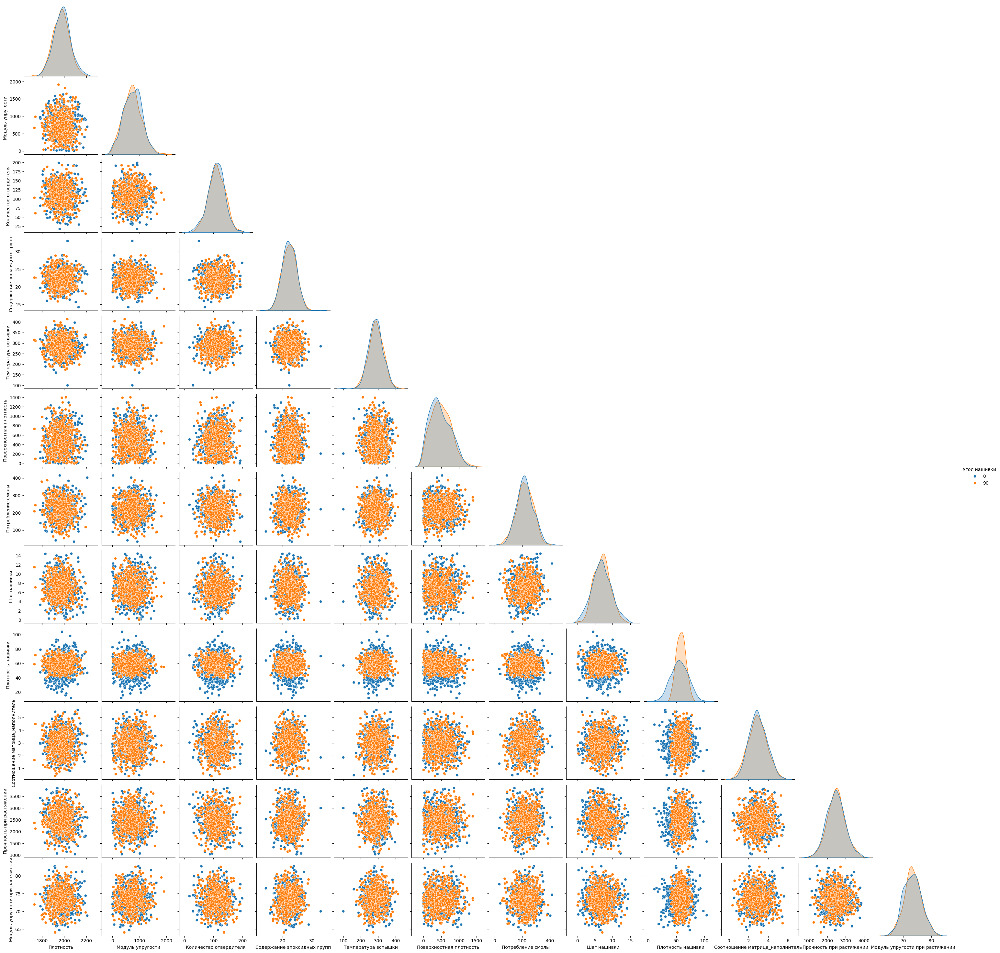

In [ ]:
# Построим попарные графики взаимоотношения параметров, а т.к. в данных есть категориальный признак "угол нашивки", 
# то сразу посмотрим, как и на что он влияет. Заодно сразу сохраним полученный график для дальнейшего использования.

sns.pairplot(df, diag_kind='kde', hue='Угол нашивки', corner=True).savefig("df_pairplot.png")

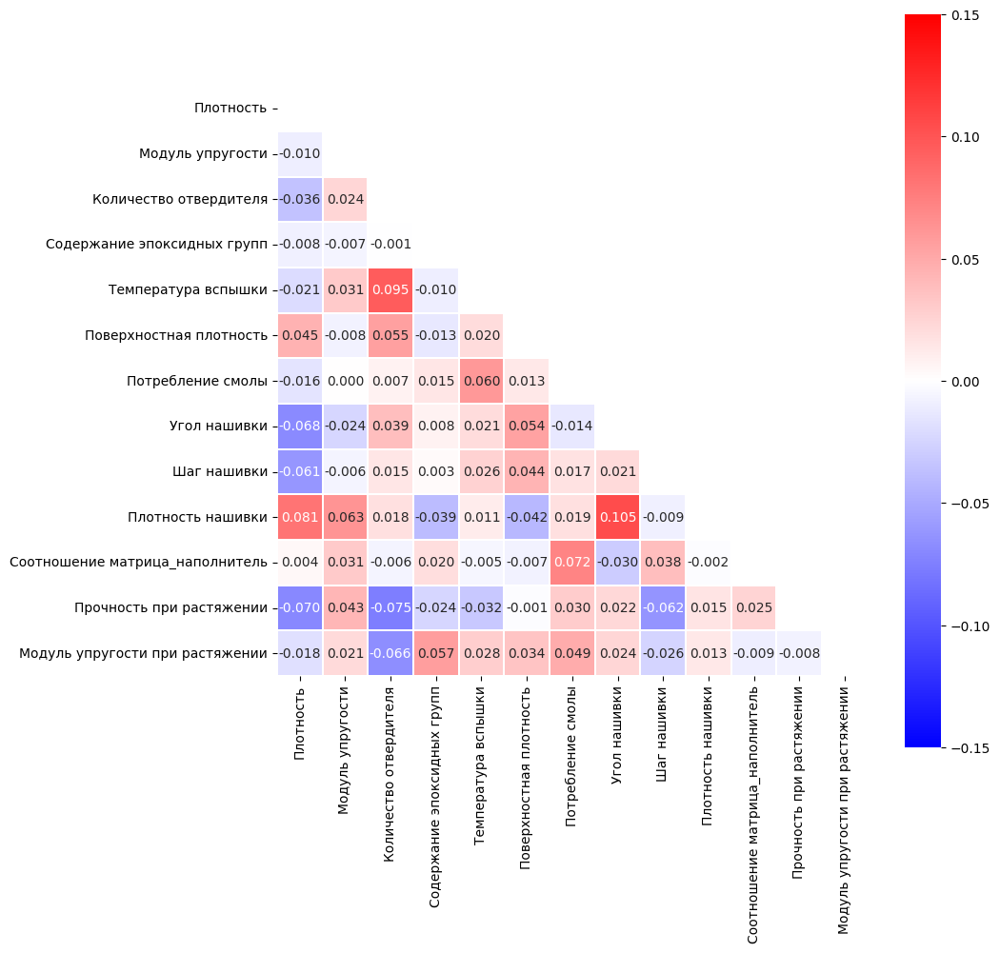

In [ ]:
# Визуальный анализ полученных графиков показывает, что между всеми факторами и целевыми признаками отсутствуют 
# какие-то значимые корреляционные связи. По некоторым факторам можно отметить наличие выбросов. 
# Какого-то разделения по признаку "угол нашивки" также на визуальном уровне не отмечается, кроме признака 
# "Плотность нашивки", диапазон значений по углу 90 меньше диапазона по углу 0.
# Скорее всего это будет вносить искажения в модель, видимо, придётся их привести к одинаковому диапазону.
# Оценим количественно корреляционные связи между признаками и целевыми переменными с помощью тепловой карты 
# и сохраним её как картинку.

plt.figure(figsize=(10,10))
matrix = np.triu(df.corr())
sns.heatmap(df.corr(), annot=True, mask=matrix, fmt='.3f', vmin=-0.15, vmax=0.15, center= 0, cmap='bwr', square=True, linewidth=0.1)
plt.savefig('df_heatmap.png')

In [ ]:
# Анализ тепловой карты показывает, что все признаки в нашем дата фрейме не имеют между собой 
# значимых коэффициентов корреляции, т.е. можно сказать, что они все независимы.

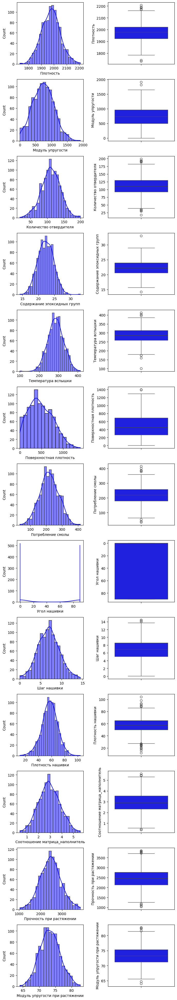

In [25]:
# Посмотрим теперь на гистограммы распределения признаков, оценим наличие выбросов и сохраним картинку
num_features = df.shape[1]
fig, axes = plt.subplots(num_features, 2, figsize=(7, 3 * num_features))

for i, column in enumerate(df.columns):
    sns.histplot(df[column], ax=axes[i, 0], kde=True, color='blue')
    sns.boxplot(y=df[column], ax=axes[i, 1], color='blue')
plt.tight_layout()
plt.savefig('AllFeatures_Hist_Box.png', dpi=150)
plt.show()

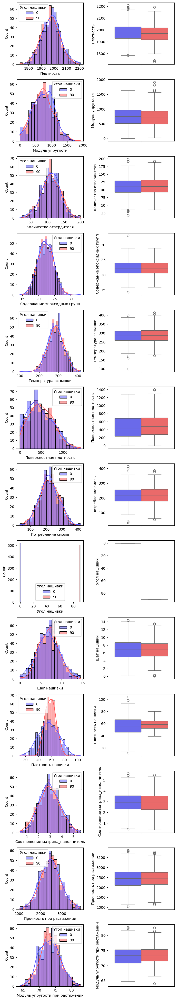

In [ ]:
# Теперь посмотрим на гистограммы распределения признаков и оценим наличие выбросов в зависимости 
# от угла нашивки и сохраним картинку

num_features = df.shape[1]
fig, axes = plt.subplots(num_features, 2, figsize=(7, 3 * num_features))

for i, column in enumerate(df.columns):
    sns.histplot(data=df, x=column, ax=axes[i, 0], kde=True, hue='Угол нашивки', palette='seismic')
    sns.boxplot(data=df, y=column, ax=axes[i, 1], hue='Угол нашивки', palette='seismic', legend=False)
plt.tight_layout()
plt.savefig('AllFeatures_Hist_Box_By_Angle.png', dpi=150)
plt.show()


In [ ]:
# Визуальный анализ гистограмм распределения признаков и ящиков с усами показывает, 
# что все наши признаки имеют распределение, близкое к нормальному.
# Какого-то значимого разделения по признаку "угол нашивки" также не отмечается, 
# кроме признака "Плотность нашивки", диапазон значений по углу 90 меньше диапазона по углу 0. 
# Следует отметить, что все признаки имеют выскоки.

## 2б. Разведочный анализ данных (EDA) (работа с выбросами).


--- Анализ для параметра 'Плотность' ---
Критерий Shapiro-Wilk: Stat=0.999, p-value=0.560, Нормальность=True
Критерий D'Agostino-Pearson: Stat=0.808, p-value=0.668, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.023, p-value=0.645, Нормальность=True
Критерий Anderson-Darling: Stat=0.366, p-value=0.784, Нормальность=True


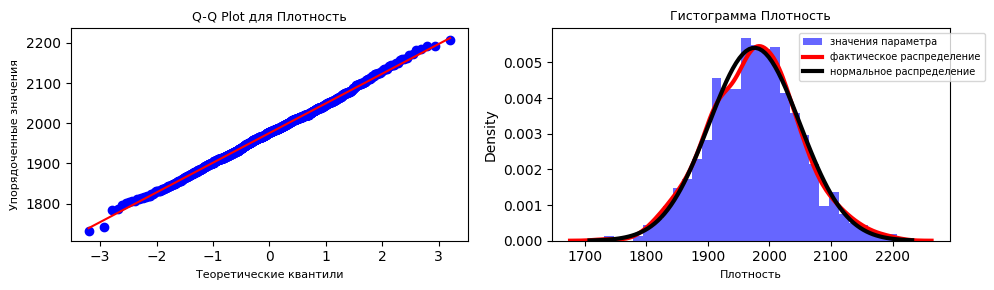


--- Анализ для параметра 'Модуль упругости' ---
Критерий Shapiro-Wilk: Stat=0.996, p-value=0.007, Нормальность=False
Критерий D'Agostino-Pearson: Stat=4.519, p-value=0.104, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.021, p-value=0.741, Нормальность=True
Критерий Anderson-Darling: Stat=0.431, p-value=0.784, Нормальность=True


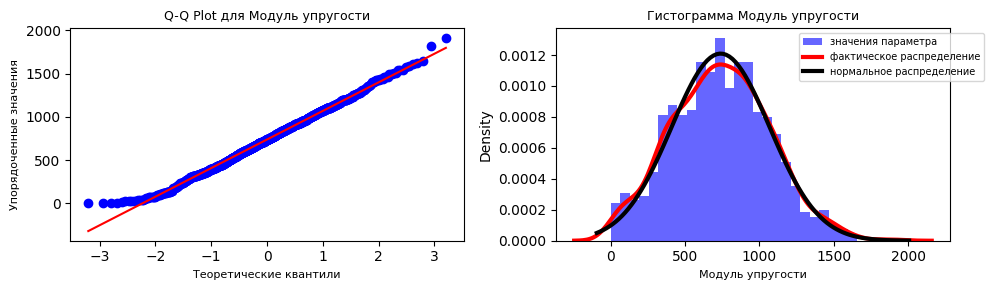


--- Анализ для параметра 'Количество отвердителя' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.215, Нормальность=True
Критерий D'Agostino-Pearson: Stat=2.182, p-value=0.336, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.019, p-value=0.863, Нормальность=True
Критерий Anderson-Darling: Stat=0.516, p-value=0.784, Нормальность=True


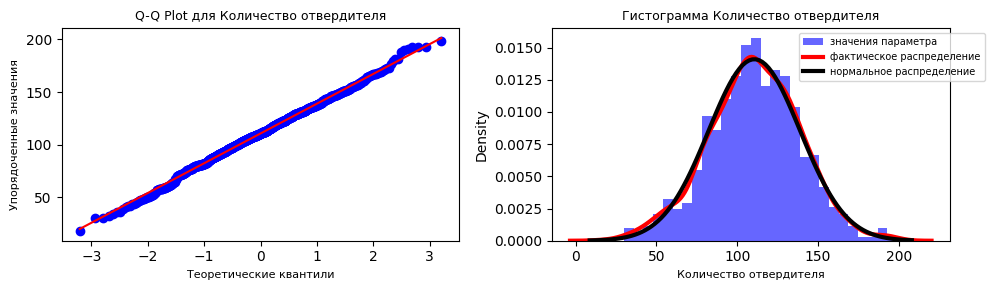


--- Анализ для параметра 'Содержание эпоксидных групп' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.259, Нормальность=True
Критерий D'Agostino-Pearson: Stat=0.616, p-value=0.735, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.019, p-value=0.830, Нормальность=True
Критерий Anderson-Darling: Stat=0.301, p-value=0.784, Нормальность=True


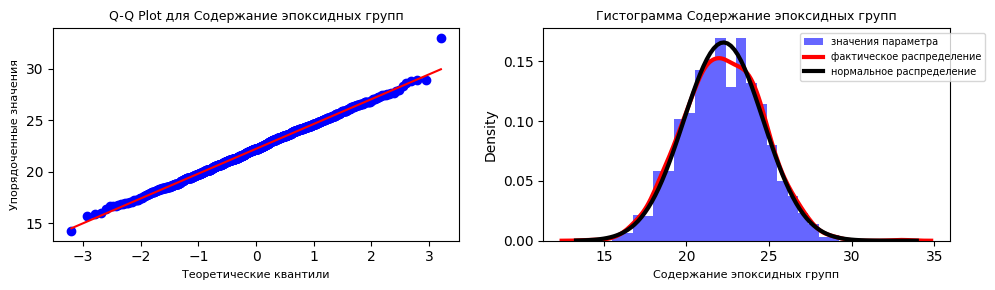


--- Анализ для параметра 'Температура вспышки' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.286, Нормальность=True
Критерий D'Agostino-Pearson: Stat=1.976, p-value=0.372, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.016, p-value=0.952, Нормальность=True
Критерий Anderson-Darling: Stat=0.238, p-value=0.784, Нормальность=True


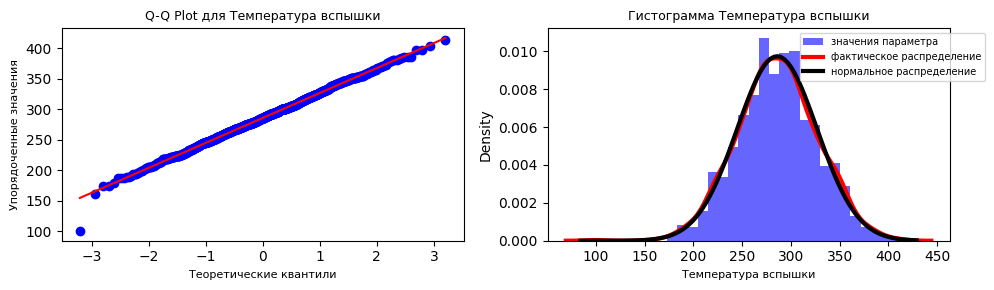


--- Анализ для параметра 'Поверхностная плотность' ---
Критерий Shapiro-Wilk: Stat=0.978, p-value=0.000, Нормальность=False
Критерий D'Agostino-Pearson: Stat=38.105, p-value=0.000, Нормальность=False
Критерий Kolmogorov-Smirnov: Stat=0.054, p-value=0.005, Нормальность=False
Критерий Anderson-Darling: Stat=4.891, p-value=0.784, Нормальность=False


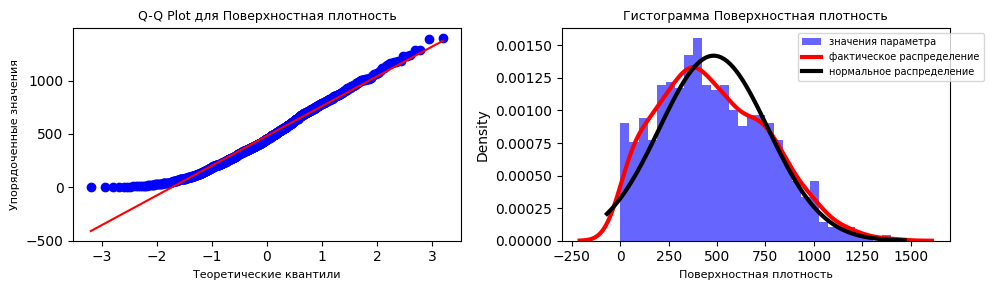


--- Анализ для параметра 'Потребление смолы' ---
Критерий Shapiro-Wilk: Stat=0.999, p-value=0.735, Нормальность=True
Критерий D'Agostino-Pearson: Stat=0.597, p-value=0.742, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.019, p-value=0.827, Нормальность=True
Критерий Anderson-Darling: Stat=0.372, p-value=0.784, Нормальность=True


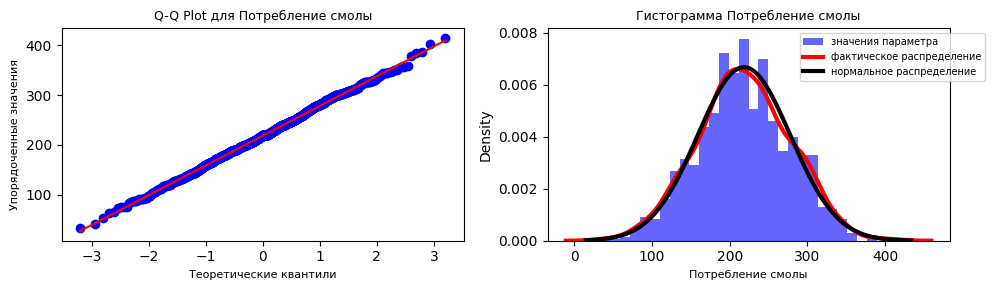


--- Анализ для параметра 'Шаг нашивки' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.153, Нормальность=True
Критерий D'Agostino-Pearson: Stat=2.251, p-value=0.324, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.020, p-value=0.776, Нормальность=True
Критерий Anderson-Darling: Stat=0.422, p-value=0.784, Нормальность=True


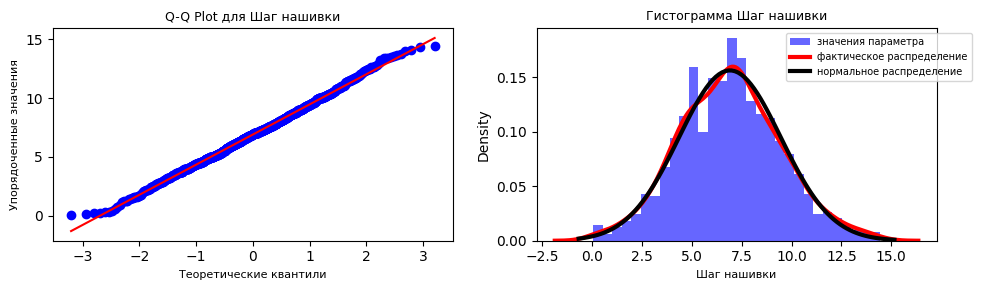


--- Анализ для параметра 'Плотность нашивки' ---
Критерий Shapiro-Wilk: Stat=0.996, p-value=0.006, Нормальность=False
Критерий D'Agostino-Pearson: Stat=12.760, p-value=0.002, Нормальность=False
Критерий Kolmogorov-Smirnov: Stat=0.029, p-value=0.341, Нормальность=True
Критерий Anderson-Darling: Stat=1.112, p-value=0.784, Нормальность=False


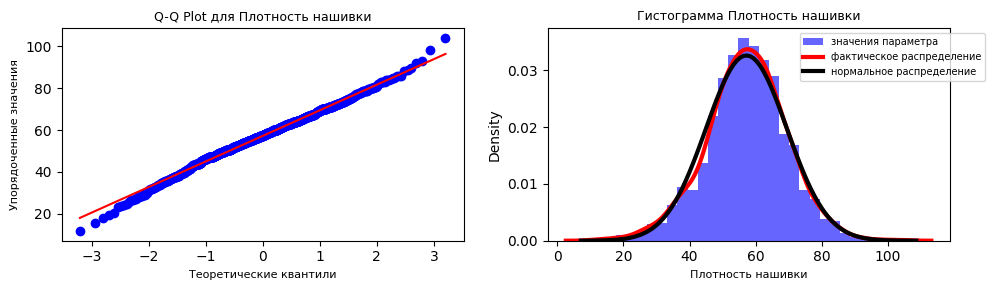


--- Анализ для параметра 'Соотношение матрица_наполнитель' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.267, Нормальность=True
Критерий D'Agostino-Pearson: Stat=3.136, p-value=0.209, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.025, p-value=0.527, Нормальность=True
Критерий Anderson-Darling: Stat=0.413, p-value=0.784, Нормальность=True


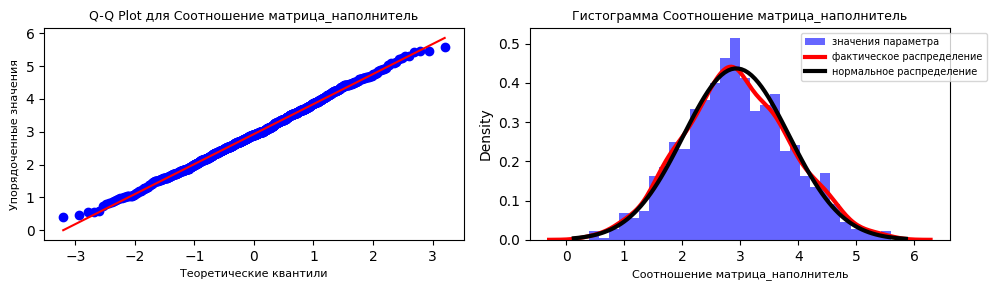


--- Анализ для параметра 'Прочность при растяжении' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.226, Нормальность=True
Критерий D'Agostino-Pearson: Stat=1.062, p-value=0.588, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.021, p-value=0.764, Нормальность=True
Критерий Anderson-Darling: Stat=0.436, p-value=0.784, Нормальность=True


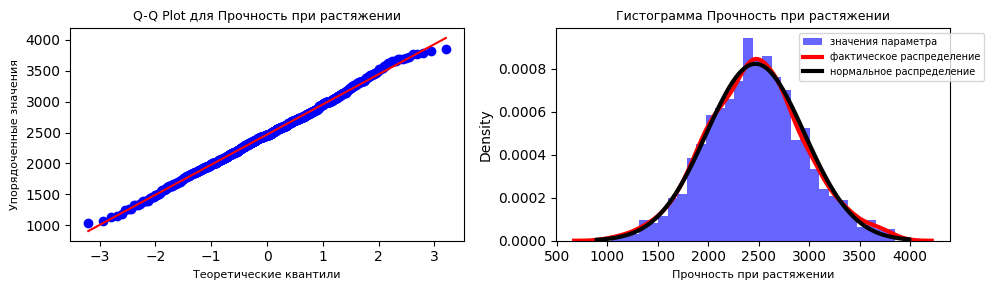


--- Анализ для параметра 'Модуль упругости при растяжении' ---
Критерий Shapiro-Wilk: Stat=0.998, p-value=0.170, Нормальность=True
Критерий D'Agostino-Pearson: Stat=3.914, p-value=0.141, Нормальность=True
Критерий Kolmogorov-Smirnov: Stat=0.019, p-value=0.842, Нормальность=True
Критерий Anderson-Darling: Stat=0.477, p-value=0.784, Нормальность=True


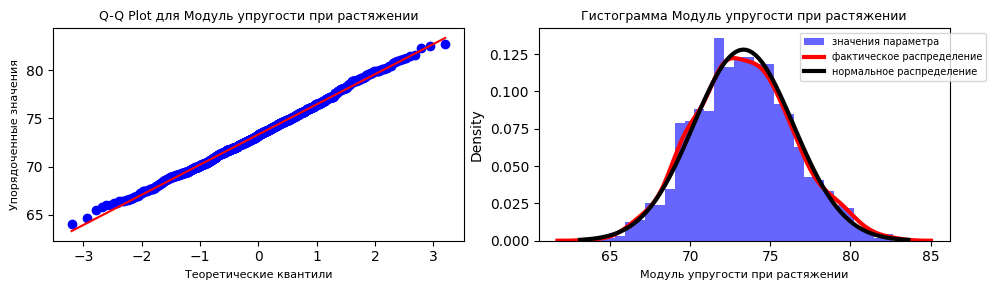

In [ ]:
# И хотя визуально распределение данных близко к нормальному, тем не менее выполним инструментальную оценку.
# Для этого будем использовать 4 наиболее часто применяемых критерия:
# 1. Критерий Шапиро-Уилка (Shapiro-Wilk test). Основан на оптимальной линейной несмещённой оценке дисперсии 
# к её обычной оценке методом максимального правдоподобия. 
# 2. Критерий Колмогорова-Смирнова (Kolmogorov-Smirnov test). Оценивает максимальное различие между 
# эмпирической функцией распределения выборки и предполагаемой теоретической функцией распределения. 
# 3. Критерий Андерсона-Дарлинга (Anderson-Darling test). Оценивает максимальное различие между эмпирической 
# функцией распределения выборки и предполагаемой теоретической функцией распределения. 
# В отличие от критерия Колмогорова-Смирнова чувствителен к отклонениям в хвостах распределения.
# 4. Критерий Д'Агостино-Пирсона (D'Agostino-Pearson (normal) test). Оценивает, насколько данные подчиняются 
# нормальному распределению, анализируя показатели асимметрии (skewness) и эксцесса (kurtosis).
# Кроме инструментальной оценки на нормальность построим для каждого параметра Q-Q графики, которые позволяют 
# визуально оценить, насколько хорошо эмпирические данные соответствуют теоретическому распределению.

import scipy.stats as stats
from scipy.stats import normaltest, shapiro, anderson, kstest
 
# Функция для проверки нормальности распределения по 4-м критериям
def check_normality(data, alpha=0.05):
    results = {}
    
    # Shapiro-Wilk test
    shapiro_stat, shapiro_p = shapiro(data)
    results['Критерий Shapiro-Wilk'] = [shapiro_stat, shapiro_p, shapiro_p > alpha]
    
    # D'Agostino-Pearson K-squared test (normaltest)
    k2_stat, k2_p = normaltest(data)
    results['Критерий D\'Agostino-Pearson'] = [k2_stat, k2_p, k2_p > alpha]
    
    # Kolmogorov-Smirnov test
    ks_stat, ks_p = kstest(data, 'norm', args=(np.mean(data), np.std(data)))
    results['Критерий Kolmogorov-Smirnov'] = [ks_stat, ks_p, ks_p > alpha]
    
    # Anderson-Darling test
    anderson_result = anderson(data, dist='norm')
    critical_value = anderson_result.critical_values[2]  # используем уровень значимости 5%
    results['Критерий Anderson-Darling'] = [anderson_result.statistic, critical_value, 
                                  anderson_result.statistic < critical_value]
    
    return results
 
# Проверяем каждую числовую колонку на нормальность и строим графики
for column in df.select_dtypes(include=[np.number]).columns:
    print(f"\n--- Анализ для параметра '{column}' ---")
    print("=" * 70)
    
    # Проверка нормальности и вывод результатов
    results = check_normality(df[column])
    for test_name, [stat, p, is_normal] in results.items():
        print(f"{test_name}: Stat={stat:.3f}, p-value={p:.3f}, Нормальность={is_normal}")
    
    # Построение графиков
    plt.figure(figsize=(10, 3))
    
    plt.subplot(1, 2, 1)
    stats.probplot(df[column], dist='norm', plot=plt)
    plt.title(f'Q-Q Plot для {column}', fontsize=9)
    plt.xlabel('Теоретические квантили', fontsize = 8)
    plt.ylabel('Упорядоченные значения', fontsize = 8)
    
    plt.subplot(1, 2, 2)
    plt.hist(df[column], bins=30, density=True, alpha=0.6, color='Blue', label='значения параметра')
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, np.mean(df[column]), np.std(df[column]))
    sns.kdeplot(df[column], color='Red', linewidth=3, label='фактическое распределение')
    plt.plot(x, p, 'k', linewidth=3, color='Black', label='нормальное распределение')
    plt.title(f'Гистограмма {column}', fontsize=9)
    plt.xlabel(f'{column}', fontsize = 8)
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1), fontsize = 7)
    
    plt.tight_layout()
    plt.show()

In [ ]:
# Анализ данных на нормальность по 4-м критериям показывает, что следующие параметры распределены нормально:
# Плотность
# Количество отвердителя
# Содержание эпоксидных групп
# Температура вспышки
# Потребление смолы
# Шаг нашивки
# Параметр 'Модуль упругости' не прошёл тест Шапиро-Уилка, 
# а по параметру 'Плотность нашивки' нормальность показал только тест Колмогорова-Смирнова.
# Вероятнее всего, это связано с выбросами в данных.
# Все целевые переменные: 'Соотношение матрица_наполнитель', 'Прочность при растяжении', 
# 'Модуль упругости при растяжении' имеют нормальное распределение.
# 
# Теперь поработаю с признаком 'Плотность нашивки', - удалю строки, в которых диапазон значений по углу 0
# выходит за пределы диапазона угла 90. 

In [50]:
# Вычисление минимального и максимального значения признака 'Плотность нашивки' для угла 90.
min_90 = df[df['Угол нашивки'] == 90]['Плотность нашивки'].min()
max_90 = df[df['Угол нашивки'] == 90]['Плотность нашивки'].max()
 
# Фильтрация строк: удаляем строки, где значения признака 'Плотность нашивки' с углом 0
# выходят за диапазон угла 90.
df_filtered = df[~((df['Угол нашивки'] == 0) & 
                   ((df['Плотность нашивки'] < min_90) | (df['Плотность нашивки'] > max_90)))]
 
print("\nДиапазон значений признака 'Плотность нашивки' для угла 90: от", min_90, "до", max_90)
print("=" * 70)
df_filtered.info()


Диапазон значений признака 'Плотность нашивки' для угла 90: от 39.3389767010898 до 80.0316194978143
<class 'pandas.core.frame.DataFrame'>
Index: 915 entries, 0 to 1021
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Плотность                        915 non-null    float64 
 1   Модуль упругости                 915 non-null    float64 
 2   Количество отвердителя           915 non-null    float64 
 3   Содержание эпоксидных групп      915 non-null    float64 
 4   Температура вспышки              915 non-null    float64 
 5   Поверхностная плотность          915 non-null    float64 
 6   Потребление смолы                915 non-null    float64 
 7   Угол нашивки                     915 non-null    category
 8   Шаг нашивки                      915 non-null    float64 
 9   Плотность нашивки                915 non-null    float64 
 10  Соотношение матрица_наполнитель  915 

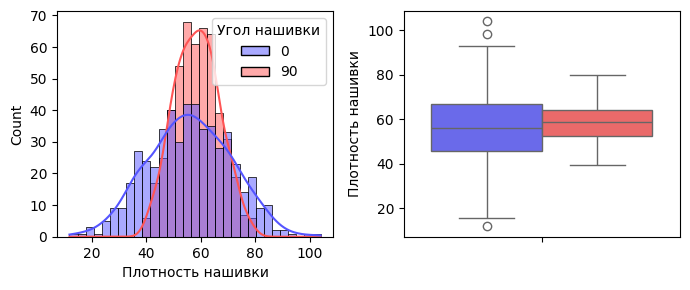

In [ ]:
# Сравним теперь характер распределения признака 'Плотность нашивки' до и после фильтрации.
# Видно, что диапазон значений теперь одинаковый.

fig, axes = plt.subplots(1, 2, figsize=(7, 3))

sns.histplot(data=df, x='Плотность нашивки', kde=True, ax=axes[0], hue='Угол нашивки', palette='seismic')
sns.boxplot(data=df, y='Плотность нашивки', hue='Угол нашивки', palette='seismic', legend=False)

plt.tight_layout()
plt.savefig('Плотность_нашивки_bef_filter.png', dpi=150)
plt.show()

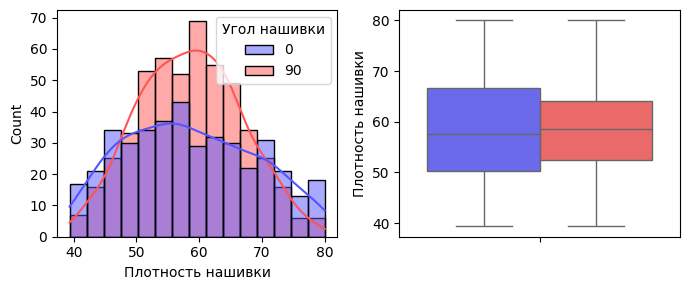

In [49]:
fig, axes = plt.subplots(1, 2, figsize=(7, 3))

sns.histplot(data=df_filtered, x='Плотность нашивки', kde=True, ax=axes[0], hue='Угол нашивки', palette='seismic')
sns.boxplot(data=df_filtered, y='Плотность нашивки', hue='Угол нашивки', palette='seismic', legend=False)

plt.tight_layout()
plt.savefig('Плотность_нашивки_aft_filter.png', dpi=150)
plt.show()

In [ ]:
# Посчитаем соотношение количества значений до и после фильтрации.
# После фильтрации возник небольшой дисбаланс.

print('Соотношение количества значений до фильтрации', (df['Угол нашивки'].value_counts()))
print("-" * 70)
print('Соотношение количества значений после фильтрации', (df_filtered['Угол нашивки'].value_counts()))


Соотношение количества значений до фильтрации Угол нашивки
0     519
90    503
Name: count, dtype: int64
----------------------------------------------------------------------
Соотношение количества значений после фильтрации Угол нашивки
90    503
0     412
Name: count, dtype: int64


In [ ]:
# Для выявления и последующего удаления выбросов применим метод межквартильных расстояний.

def find_outliers_iqr(data):
    df_cleaned = data.copy()

    outliers_list = []  # Создадим список для индексов выбросов и для числовых столбцов
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    
    for col in numeric_columns: # Вычисляем квартили, межквартильное расстояние и определяем границы выбросов
        Q1 = data[col].quantile(0.25) 
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Находим выбросы, сохраняем их индексы, заменяем выбросы на NaN в копии данных
        outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
        outliers_list.append(outliers.index)
        df_cleaned.loc[outliers.index, col] = np.nan
            
    # Объединяем все найденные индексы выбросов и создаём DataFrame с выбросами
    all_outliers_index = pd.Index(np.unique(np.concatenate(outliers_list)))
    df_outliers = data.loc[all_outliers_index]
    
    return df_cleaned, df_outliers
 
# Применяем функцию и сразу удаляем строки с NaN
cleaned_df, outliers_df = find_outliers_iqr(df_filtered)
cleaned_df = cleaned_df.dropna()
 
print("Очищенный DataFrame:")
print(cleaned_df.info())
print("\nDataFrame с выбросами:")
print(outliers_df.info())

Очищенный DataFrame:
<class 'pandas.core.frame.DataFrame'>
Index: 813 entries, 1 to 1021
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Плотность                        813 non-null    float64 
 1   Модуль упругости                 813 non-null    float64 
 2   Количество отвердителя           813 non-null    float64 
 3   Содержание эпоксидных групп      813 non-null    float64 
 4   Температура вспышки              813 non-null    float64 
 5   Поверхностная плотность          813 non-null    float64 
 6   Потребление смолы                813 non-null    float64 
 7   Угол нашивки                     813 non-null    category
 8   Шаг нашивки                      813 non-null    float64 
 9   Плотность нашивки                813 non-null    float64 
 10  Соотношение матрица_наполнитель  813 non-null    float64 
 11  Прочность при растяжении         813 non-null    float

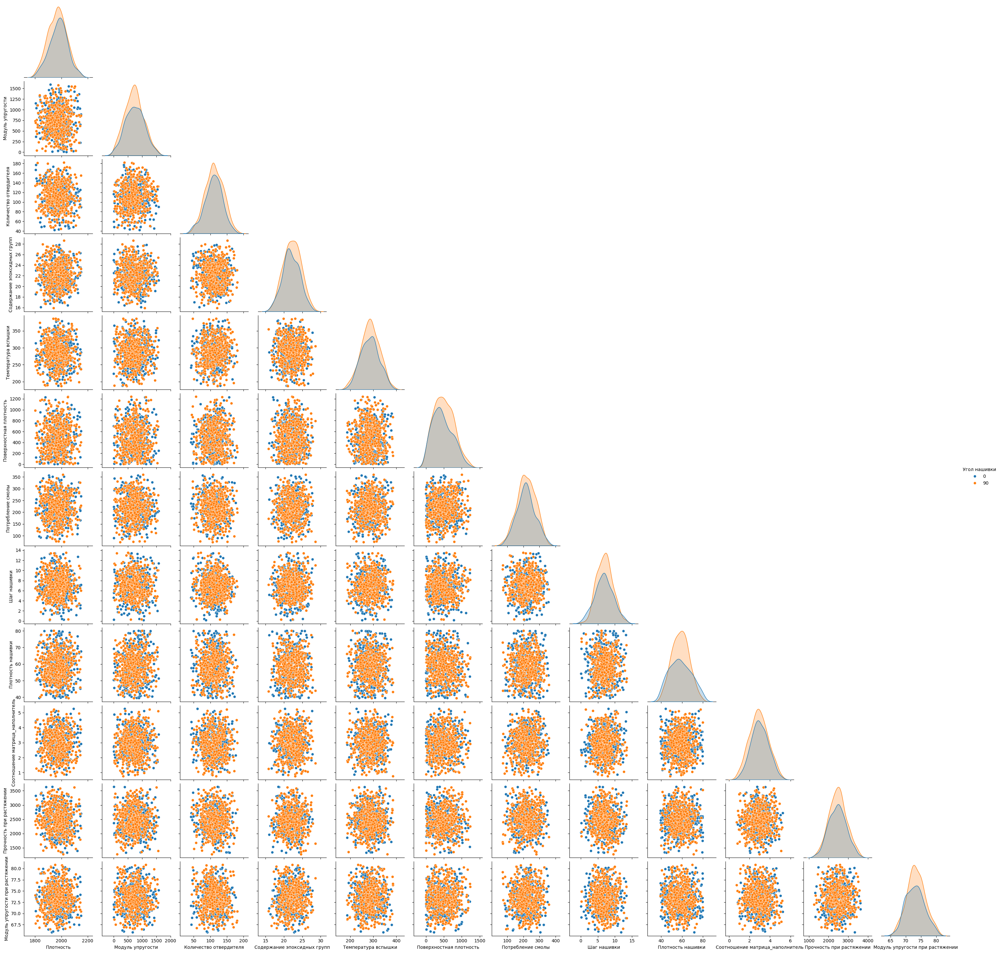

In [79]:
# Построим ещё раз попарные графики взаимоотношения параметров с разделением по категориальному признаку "угол нашивки".
# Заодно сразу сохраним полученный график для дальнейшего использования.
sns.pairplot(cleaned_df, diag_kind='kde', hue='Угол нашивки', corner=True).savefig('df_filt_clean_pairplot.png')

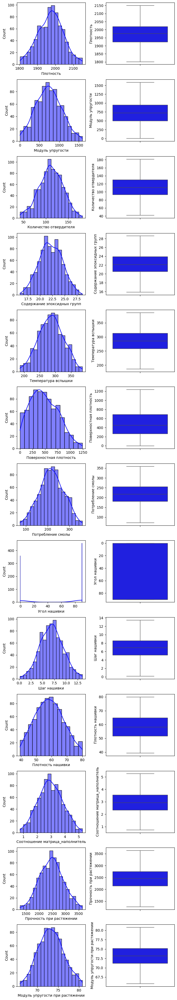

In [81]:
# Посмотрим теперь на гистограммы распределения признаков, оценим наличие выбросов и сохраним картинку
num_features = cleaned_df.shape[1]
fig, axes = plt.subplots(num_features, 2, figsize=(7, 3 * num_features))

for i, column in enumerate(cleaned_df.columns):
    sns.histplot(cleaned_df[column], ax=axes[i, 0], kde=True, color='blue')
    sns.boxplot(y=cleaned_df[column], ax=axes[i, 1], color='blue')
plt.tight_layout()
plt.savefig('AllFeatures_filt_clean_Hist_Box.png', dpi=150)
plt.show()

In [95]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 813 entries, 1 to 1021
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Плотность                        813 non-null    float64 
 1   Модуль упругости                 813 non-null    float64 
 2   Количество отвердителя           813 non-null    float64 
 3   Содержание эпоксидных групп      813 non-null    float64 
 4   Температура вспышки              813 non-null    float64 
 5   Поверхностная плотность          813 non-null    float64 
 6   Потребление смолы                813 non-null    float64 
 7   Угол нашивки                     813 non-null    category
 8   Шаг нашивки                      813 non-null    float64 
 9   Плотность нашивки                813 non-null    float64 
 10  Соотношение матрица_наполнитель  813 non-null    float64 
 11  Прочность при растяжении         813 non-null    float64 
 12  Модуль упруг

In [82]:
# Как показывает визуальный анализ, в подготовленных данных выбросов не осталось, 
# характер попарного сопоставление не изменился, в результате подготовки и очистки данных в итоговом датасете 
# осталось 813 строк.
# Сохраню подготовленный для анализа датафрейм и датафрейм с выбросами в отдельные файлы.
cleaned_df.to_excel("CleanedDataFrame.xlsx")
outliers_df.to_excel("OutliersDataFrame.xlsx")


In [4]:
cleaned_df = pd.read_excel("CleanedDataFrame.xlsx", index_col='Unnamed: 0')
cleaned_df['Угол нашивки'] = cleaned_df['Угол нашивки'].astype('category')
cleaned_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Плотность,813.0,NaN,NaN,NaN,1973.305080,69.536751,1801.940695,1923.566230,1976.800187,2019.065966,2150.793053
Модуль упругости,813.0,NaN,NaN,NaN,731.777187,326.047734,2.436909,496.873650,724.109184,951.030579,1588.677217
Количество отвердителя,813.0,NaN,NaN,NaN,111.346533,26.594886,41.886277,93.290977,111.259275,130.163998,181.828448
Содержание эпоксидных групп,813.0,NaN,NaN,NaN,22.143151,2.343374,15.881668,20.555344,22.130284,23.914238,28.620116
Температура вспышки,813.0,NaN,NaN,NaN,286.077341,39.538176,186.508613,258.370169,286.302097,313.046103,385.894771
Поверхностная плотность,813.0,NaN,NaN,NaN,480.130547,275.945272,0.603740,264.538975,453.919475,691.280873,1238.476416
Потребление смолы,813.0,NaN,NaN,NaN,217.511640,56.121929,72.530873,180.329055,217.481262,255.304191,359.052220
Угол нашивки,813.0,2.0,90.0,455.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Шаг нашивки,813.0,NaN,NaN,NaN,6.912574,2.473641,0.145034,5.167349,6.936649,8.582372,13.484945
Плотность нашивки,813.0,NaN,NaN,NaN,58.431672,9.194747,39.338977,51.690374,58.271705,64.798020,80.031619


In [5]:
# Сравним несколько вариантов нормализации данных

from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer

numerical_features = cleaned_df.select_dtypes(include=['float64']).columns.tolist()
categorical_features = cleaned_df.select_dtypes(include=['category']).columns.tolist()

# Создаем преобразователь колонок для MinMaxScaler
preprocessorMinMax = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)
 
# Применяем нормализацию
df_normalized_MinMax = preprocessorMinMax.fit_transform(cleaned_df)
 
# Получаем имена новых признаков после OneHotEncoder
onehot_columns = preprocessorMinMax.named_transformers_['cat'].get_feature_names_out(categorical_features)
 
# Объединяем все имена признаков
feature_names = np.append(numerical_features, onehot_columns)
 
# Создаем новый DataFrame с нормализованными данными после MinMaxScsler
df_normalized_MinMax = pd.DataFrame(df_normalized_MinMax, columns=feature_names)
 
df_normalized_MinMax.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
Плотность,813.0,0.491223,0.199330,0.0,0.348645,0.501242,0.622399,1.0
Модуль упругости,813.0,0.459792,0.205548,0.0,0.311704,0.454958,0.598014,1.0
Количество отвердителя,813.0,0.496350,0.190042,0.0,0.367328,0.495726,0.630816,1.0
Содержание эпоксидных групп,813.0,0.491542,0.183961,0.0,0.366895,0.490532,0.630577,1.0
Температура вспышки,813.0,0.499376,0.198300,0.0,0.360414,0.500504,0.634635,1.0
Поверхностная плотность,813.0,0.387380,0.222919,0.0,0.213217,0.366205,0.557955,1.0
Потребление смолы,813.0,0.506003,0.195873,0.0,0.376231,0.505897,0.637905,1.0
Шаг нашивки,813.0,0.507315,0.185432,0.0,0.376488,0.509120,0.632488,1.0
Плотность нашивки,813.0,0.469193,0.225956,0.0,0.303529,0.465262,0.625642,1.0
Соотношение матрица_наполнитель,813.0,0.487553,0.195325,0.0,0.353630,0.483089,0.621704,1.0


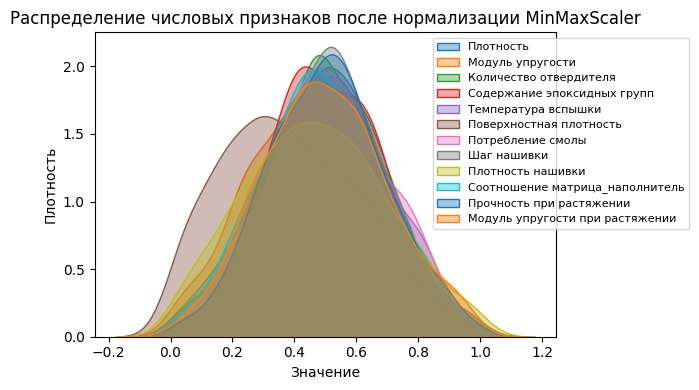

In [6]:
visual_columns = df_normalized_MinMax.select_dtypes(include=np.number).columns.tolist()
visual_columns.remove('Угол нашивки_0')
visual_columns.remove('Угол нашивки_90')
 
plt.figure(figsize=(7, 4))

for column in visual_columns:
    sns.kdeplot(data=df_normalized_MinMax, x=column, label=column, fill=True, alpha=0.4)
 
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1), fontsize = 8)
plt.title('Распределение числовых признаков после нормализации MinMaxScaler')
plt.xlabel('Значение')
plt.ylabel('Плотность')

plt.tight_layout()
plt.show()

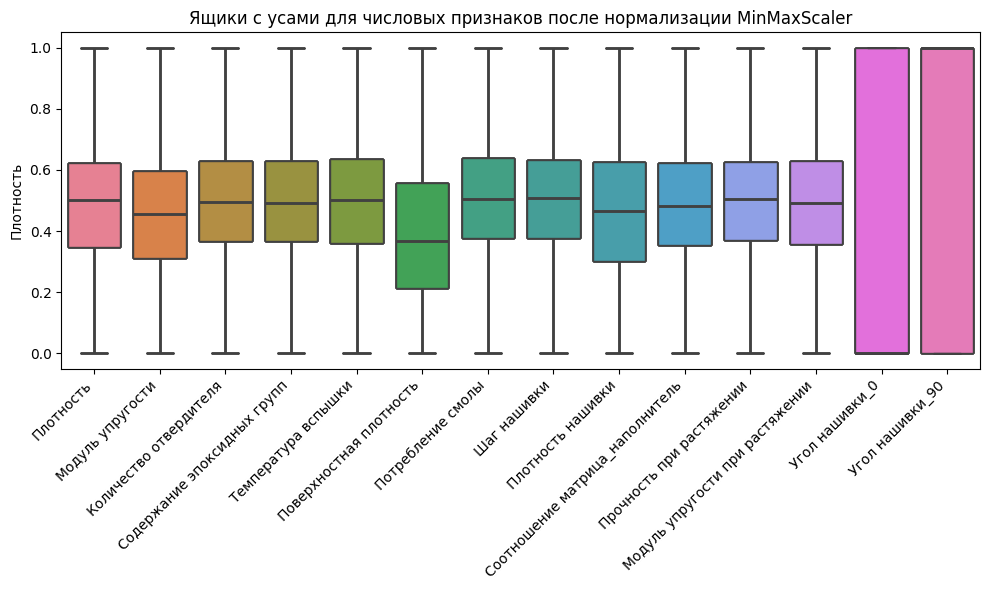

In [7]:
plt.figure(figsize=(10, 6))

for column in visual_columns:
    sns.boxplot(data=df_normalized_MinMax)
 
plt.title('Ящики с усами для числовых признаков после нормализации MinMaxScaler')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Плотность')

plt.tight_layout()
plt.show()

In [8]:
# Создаем преобразователь колонок для StandardScaler
preprocessorStandard = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)
 
# Применяем нормализацию
df_normalized_Standard = preprocessorStandard.fit_transform(cleaned_df)
 
# Получаем имена новых признаков после OneHotEncoder
onehot_columns = preprocessorStandard.named_transformers_['cat'].get_feature_names_out(categorical_features)
 
# Объединяем все имена признаков
feature_names = np.append(numerical_features, onehot_columns)
 
# Создаем новый DataFrame с нормализованными данными после StandardScaler
df_normalized_Standard = pd.DataFrame(df_normalized_Standard, columns=feature_names)
 
df_normalized_Standard.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
Плотность,813.0,1.796021e-15,1.000616,-2.465888,-0.715729,0.050294,0.658487,2.554005
Модуль упругости,813.0,2.621929e-17,1.000616,-2.238290,-0.720901,-0.023533,0.672872,2.629761
Количество отвердителя,813.0,2.993369e-16,1.000616,-2.613398,-0.679329,-0.003283,0.707995,2.651837
Содержание эпоксидных групп,813.0,1.280375e-15,1.000616,-2.673640,-0.677990,-0.005494,0.756250,2.765649
Температура вспышки,813.0,-1.162388e-15,1.000616,-2.519844,-0.701201,0.005688,0.682514,2.526138
Поверхностная плотность,813.0,-1.529459e-16,1.000616,-1.738830,-0.781765,-0.095045,0.765660,2.749867
Потребление смолы,813.0,-1.000703e-15,1.000616,-2.584908,-0.662940,-0.000542,0.673815,2.523572
Шаг нашивки,813.0,2.556381e-16,1.000616,-2.737545,-0.705963,0.009739,0.675452,2.658598
Плотность нашивки,813.0,-5.243858e-17,1.000616,-2.077757,-0.733620,-0.017408,0.692816,2.350608
Соотношение матрица_наполнитель,813.0,5.855641e-16,1.000616,-2.497641,-0.686060,-0.022865,0.687231,2.625174


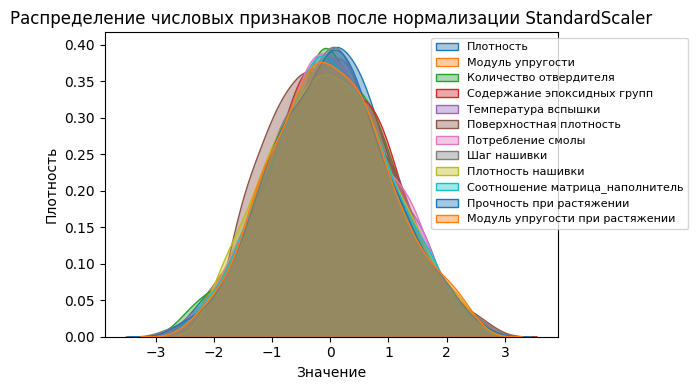

In [9]:
visual_columns = df_normalized_Standard.select_dtypes(include=np.number).columns.tolist()
visual_columns.remove('Угол нашивки_0')
visual_columns.remove('Угол нашивки_90')
 
plt.figure(figsize=(7, 4))

for column in visual_columns:
    sns.kdeplot(data=df_normalized_Standard, x=column, label=column, fill=True, alpha=0.4)
 
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1), fontsize = 8)
plt.title('Распределение числовых признаков после нормализации StandardScaler')
plt.xlabel('Значение')
plt.ylabel('Плотность')

plt.tight_layout()
plt.show()

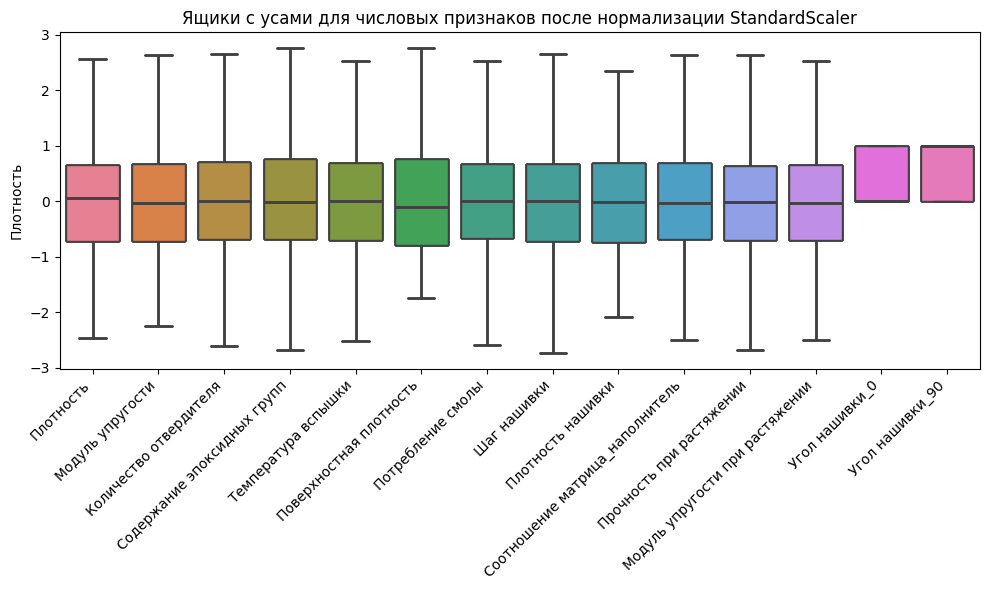

In [10]:
plt.figure(figsize=(10, 6))

for column in visual_columns:
    sns.boxplot(data=df_normalized_Standard)
 
plt.title('Ящики с усами для числовых признаков после нормализации StandardScaler')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Плотность')

plt.tight_layout()
plt.show()

In [11]:
# Создаем преобразователь колонок для RobustScaler
preprocessorRobust = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)
 
# Применяем нормализацию
df_normalized_Robust = preprocessorRobust.fit_transform(cleaned_df)
 
# Получаем имена новых признаков после OneHotEncoder
onehot_columns = preprocessorRobust.named_transformers_['cat'].get_feature_names_out(categorical_features)
 
# Объединяем все имена признаков
feature_names = np.append(numerical_features, onehot_columns)
 
# Создаем новый DataFrame с нормализованными данными после RobustScaler
df_normalized_Robust = pd.DataFrame(df_normalized_Robust, columns=feature_names)
 
df_normalized_Robust.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
Плотность,813.0,-0.036598,0.728136,-1.830994,-0.557425,0.0,0.442575,1.821920
Модуль упругости,813.0,0.016884,0.717919,-1.589037,-0.500346,0.0,0.499654,1.903677
Количество отвердителя,813.0,0.002366,0.721256,-1.881403,-0.487302,0.0,0.512698,1.913843
Содержание эпоксидных групп,813.0,0.003831,0.697662,-1.860319,-0.468886,0.0,0.531114,1.932133
Температура вспышки,813.0,-0.004111,0.723137,-1.825181,-0.510863,0.0,0.489137,1.821508
Поверхностная плотность,813.0,0.061421,0.646633,-1.062271,-0.443782,0.0,0.556218,1.838481
Потребление смолы,813.0,0.000405,0.748541,-1.933313,-0.495527,0.0,0.504473,1.888239
Шаг нашивки,813.0,-0.007050,0.724341,-1.988746,-0.518093,0.0,0.481907,1.917497
Плотность нашивки,813.0,0.012204,0.701480,-1.444403,-0.502099,0.0,0.497901,1.660093
Соотношение матрица_наполнитель,813.0,0.016650,0.728626,-1.802078,-0.482924,0.0,0.517076,1.928244


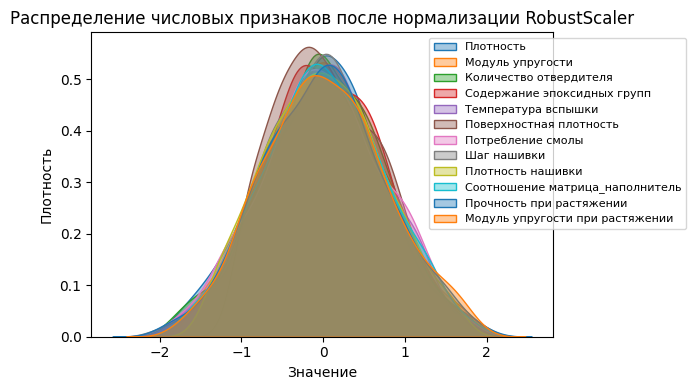

In [12]:
visual_columns = df_normalized_Robust.select_dtypes(include=np.number).columns.tolist()
visual_columns.remove('Угол нашивки_0')
visual_columns.remove('Угол нашивки_90')
 
plt.figure(figsize=(7, 4))

for column in visual_columns:
    sns.kdeplot(data=df_normalized_Robust, x=column, label=column, fill=True, alpha=0.4)
 
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1), fontsize = 8)
plt.title('Распределение числовых признаков после нормализации RobustScaler')
plt.xlabel('Значение')
plt.ylabel('Плотность')

plt.tight_layout()
plt.show()

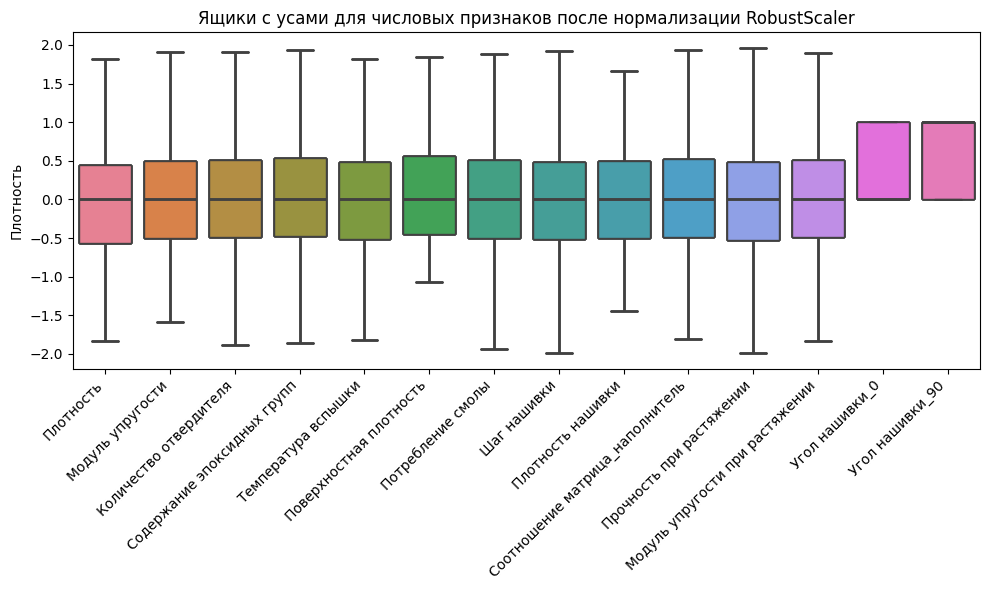

In [13]:
plt.figure(figsize=(10, 6))

for column in visual_columns:
    sns.boxplot(data=df_normalized_Robust)
 
plt.title('Ящики с усами для числовых признаков после нормализации RobustScaler')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Плотность')

plt.tight_layout()
plt.show()

In [ ]:
# По визуальному анализу и описательной статистике наиболее предпочтительным вариантом нормализации 
# для дальнейшей работы является вариант, полученный с помощью StandartScaler. 